In [1]:
from pathlib import Path
import os
import pandas as pd
import sys
import requests
from functools import partial
from tqdm import tqdm

import torch
import torchvision
from torchvision.io import read_image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch 
from einops import rearrange, repeat
from loguru import logger
from torchmetrics import Metric, BootStrapper
import matplotlib.pyplot as plt
from PIL import Image
import pickle
import seaborn as sns
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt
from cka import gram, centering_mat, centered_gram, unbiased_hsic_xy, MinibatchCKA, HookedCache, make_pairwise_metrics, update_metrics, get_simmat_from_metrics
import numpy as np
import re

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

import timm
from timm.utils import accuracy
from torch.utils.tensorboard import SummaryWriter

from get_models import get_model

writer = SummaryWriter()

DEVICE = torch.device('cpu')
if torch.cuda.is_available():
  DEVICE = torch.device('cuda')

/private/home/sshkhr/.conda/envs/pytorch_env/lib/python3.9/site-packages/MinkowskiEngine-0.5.4-py3.9-linux-x86_64.egg/MinkowskiEngine/__init__.py:36: UserWarning: The environment variable `OMP_NUM_THREADS` not set. MinkowskiEngine will automatically set `OMP_NUM_THREADS=16`. If you want to set `OMP_NUM_THREADS` manually, please export it on the command line before running a python script. e.g. `export OMP_NUM_THREADS=12; python your_program.py`. It is recommended to set it below 24.
  warnings.warn(


## Create Deit models

In [2]:
def get_deit_base():
    model = timm.create_model(
            'deit_base_patch16_224',
            pretrained=False,
            num_classes=1000,
            drop_rate=0.0,
            drop_path_rate=0.1,
            drop_block_rate=None,
            img_size=224
        )

    return model

## Get pre-trained and fine-tuned models

In [3]:
algs = ['DINO', 'MoCo-V3', 'MAE']
trainings = ['pretrained', 'finetuned']

In [4]:
locs = {}
locs['MoCo-V3'] = {}
locs['MoCo-V3']['pretrained'] = '/private/home/sshkhr/mae/checkpoints/pretrained/mocov3-vit-b-300ep-deit.pth'
locs['MoCo-V3']['finetuned'] = '/private/home/sshkhr/mae/checkpoints/dino-ft-all/SLURM/checkpoint.pth'
locs['MAE'] = {}
locs['MAE']['pretrained'] = '/private/home/sshkhr/mae/checkpoints/pretrained/mae_pretrain_vit_base.pth'
locs['MAE']['finetuned'] = '/private/home/sshkhr/mae/checkpoints/mae-ft-all/SLURM/checkpoint.pth'
locs['DINO'] = {}
locs['DINO']['pretrained'] = '/private/home/sshkhr/mae/checkpoints/pretrained/dino_vitbase16_pretrain.pth'
locs['DINO']['finetuned'] = '/private/home/sshkhr/mae/checkpoints/dino-ft-all/SLURM/checkpoint.pth'

In [6]:
models = {}

for alg in algs:
    models[alg] = {}
    for training in trainings:
        print(alg, training)
        models[alg][training] = get_deit_base()

        checkpoint = torch.load(locs[alg][training], map_location='cpu')

        if 'model' in checkpoint:
            checkpoint['model'] = {k.replace('base_encoder.', ''): v for k, v in checkpoint['model'].items()}
            checkpoint['model'] = {k.replace('encoder.', ''): v for k, v in checkpoint['model'].items()}
        elif 'target_encoder' in checkpoint:
            checkpoint['model'] = {k.replace('module.', ''): v for k, v in checkpoint['target_encoder'].items()}

        if 'model' in checkpoint:
            checkpoint_model = checkpoint['model']
        else:
            checkpoint_model = checkpoint
            
        state_dict = models[alg][training].state_dict()
        for k in ['head.weight', 'head.bias', 'head_dist.weight', 'head_dist.bias']:
            if k in checkpoint_model and checkpoint_model[k].shape != state_dict[k].shape:
                print(f"Removing key {k} from pretrained checkpoint")
                del checkpoint_model[k]

        # interpolate position embedding
        pos_embed_checkpoint = checkpoint_model['pos_embed']
        embedding_size = pos_embed_checkpoint.shape[-1]
        num_patches = models[alg][training].patch_embed.num_patches
        num_extra_tokens = models[alg][training].pos_embed.shape[-2] - num_patches
        # height (== width) for the checkpoint position embedding
        orig_size = int((pos_embed_checkpoint.shape[-2] - num_extra_tokens) ** 0.5)
        # height (== width) for the new position embedding
        new_size = int(num_patches ** 0.5)
        # class_token and dist_token are kept unchanged
        extra_tokens = pos_embed_checkpoint[:, :num_extra_tokens]
        # only the position tokens are interpolated
        pos_tokens = pos_embed_checkpoint[:, num_extra_tokens:]
        pos_tokens = pos_tokens.reshape(-1, orig_size, orig_size, embedding_size).permute(0, 3, 1, 2)
        pos_tokens = torch.nn.functional.interpolate(
            pos_tokens, size=(new_size, new_size), mode='bicubic', align_corners=False)
        pos_tokens = pos_tokens.permute(0, 2, 3, 1).flatten(1, 2)
        new_pos_embed = torch.cat((extra_tokens, pos_tokens), dim=1)
        checkpoint_model['pos_embed'] = new_pos_embed

        msg = models[alg][training].load_state_dict(checkpoint_model, strict=False)
        print(msg)

DINO pretrained
_IncompatibleKeys(missing_keys=['head.weight', 'head.bias'], unexpected_keys=[])
DINO finetuned
<All keys matched successfully>
MoCo-V3 pretrained
_IncompatibleKeys(missing_keys=['head.weight', 'head.bias'], unexpected_keys=[])
MoCo-V3 finetuned
<All keys matched successfully>
MAE pretrained
_IncompatibleKeys(missing_keys=['head.weight', 'head.bias'], unexpected_keys=[])
MAE finetuned
<All keys matched successfully>


## Get distance in parameter space

In [7]:
distances = {}

In [8]:
for alg in algs:
    distances[alg] = {}

    model_pt = models[alg]['pretrained']
    model_ft = models[alg]['finetuned']

    pt_module_names = [name for name, _ in model_pt.named_modules()]
    pt_modules = {name: module for name, module in model_pt.named_modules()}
    ft_module_names = [name for name, _ in model_ft.named_modules()]
    ft_modules = {name: module for name, module in model_ft.named_modules()}

    common_module_names = [name for name in ft_module_names if name in pt_module_names and name !='' and name!='head']

    for name in common_module_names:
        pt_module = pt_modules[name]
        ft_module = ft_modules[name]

        try:
            ft_parameters = torch.nn.utils.parameters_to_vector(ft_module.parameters())
            pt_parameters = torch.nn.utils.parameters_to_vector(pt_module.parameters())
        except:
            continue

        distances[alg][name] = torch.norm(pt_parameters - ft_parameters).item()

        print(alg, name, distances[alg][name])

DINO patch_embed 26.649158477783203
DINO patch_embed.proj 26.649158477783203
DINO blocks 488.4295959472656
DINO blocks.0 112.42900085449219
DINO blocks.0.norm1 29.863391876220703
DINO blocks.0.attn 73.16531372070312
DINO blocks.0.attn.qkv 63.79120635986328
DINO blocks.0.attn.proj 35.83675765991211
DINO blocks.0.norm2 28.01856231689453
DINO blocks.0.mlp 74.93143463134766
DINO blocks.0.mlp.fc1 52.83906173706055
DINO blocks.0.mlp.fc2 53.13456344604492
DINO blocks.1 125.55859375
DINO blocks.1.norm1 12.030702590942383
DINO blocks.1.attn 70.86577606201172
DINO blocks.1.attn.qkv 61.64546585083008
DINO blocks.1.attn.proj 34.958553314208984
DINO blocks.1.norm2 13.392365455627441
DINO blocks.1.mlp 102.08869171142578
DINO blocks.1.mlp.fc1 71.39549255371094
DINO blocks.1.mlp.fc2 72.98304748535156
DINO blocks.2 131.82449340820312
DINO blocks.2.norm1 7.847653865814209
DINO blocks.2.attn 77.12065124511719
DINO blocks.2.attn.qkv 67.72360229492188
DINO blocks.2.attn.proj 36.897491455078125
DINO blocks.

## Visualize layer-wise and total distances

In [9]:
import pandas as pd

In [10]:
distances_df = pd.DataFrame(distances)

In [11]:
distances_df = distances_df.rename_axis('layer').reset_index()

In [12]:
distances_df.to_csv('PT_to_FT_dist_ICML.csv', index=False)

In [12]:
distances_df.head(10)

,layer,DINO,MoCo-V3,MAE
0,patch_embed,26.698061,36.325027,32.011303
1,patch_embed.proj,26.698061,36.325027,32.011303
2,blocks,494.669647,591.185791,623.237000
3,blocks.0,112.683800,165.558685,146.124191
4,blocks.0.norm1,29.800669,4.154187,5.734034
5,blocks.0.attn,73.475822,90.441879,82.838272
6,blocks.0.attn.qkv,64.054482,81.514893,73.926514
7,blocks.0.attn.proj,35.996449,39.180515,37.377701
8,blocks.0.norm2,28.030943,7.975926,15.905671
9,blocks.0.mlp,75.005394,138.383179,119.183754


## Visualize

In [13]:
distances_df_new = pd.melt(distances_df, id_vars='layer', value_vars=algs, value_name='L2-norm distance', var_name='pretraining')

### Transformer Blocks

In [14]:
blocks = ['blocks.'+ str(i) for i in range(12)]
df = distances_df_new[distances_df_new['layer'].isin(blocks)]

In [15]:
fig_dir = '/private/home/sshkhr/mae/figures/dynamics/Distances/'

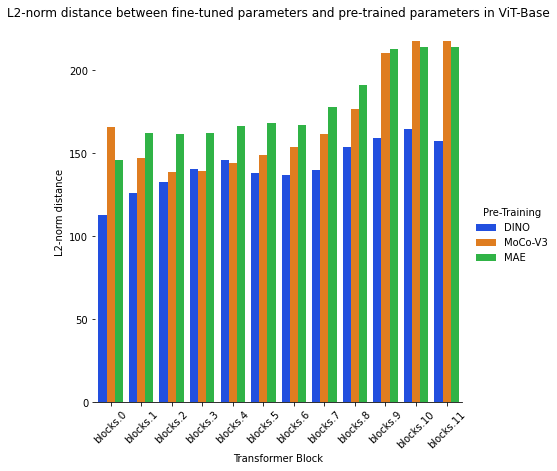

In [19]:
g = sns.catplot(
    data=df, kind="bar",
    x="layer", y="L2-norm distance", hue="pretraining",
    palette="bright", height=6
)
g.despine(left=True)
g.set_axis_labels("Transformer Block", "L2-norm distance")
g.legend.set_title("Pre-Training")

plt.xticks(rotation=45)
plt.title("L2-norm distance between fine-tuned parameters and pre-trained parameters in ViT-Base")
plt.savefig(fig_dir+'vit_blocks.png', dpi=300, bbox_inches='tight')

In [20]:
blocks = ['blocks.'+ str(i) +'.attn' for i in range(12)]
df = distances_df_new[distances_df_new['layer'].isin(blocks)]

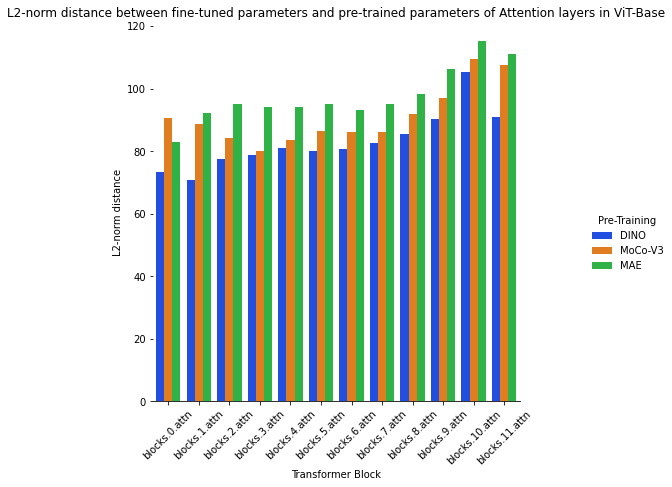

In [21]:
g = sns.catplot(
    data=df, kind="bar",
    x="layer", y="L2-norm distance", hue="pretraining",
    palette="bright", height=6
)
g.despine(left=True)
g.set_axis_labels("Transformer Block", "L2-norm distance")
g.legend.set_title("Pre-Training")

plt.xticks(rotation=45)
plt.title("L2-norm distance between fine-tuned parameters and pre-trained parameters of Attention layers in ViT-Base")
plt.savefig(fig_dir+'all_attn_layers.png', dpi=300, bbox_inches='tight')

In [22]:
blocks = ['blocks.'+ str(i) +'.mlp' for i in range(12)]
df = distances_df_new[distances_df_new['layer'].isin(blocks)]

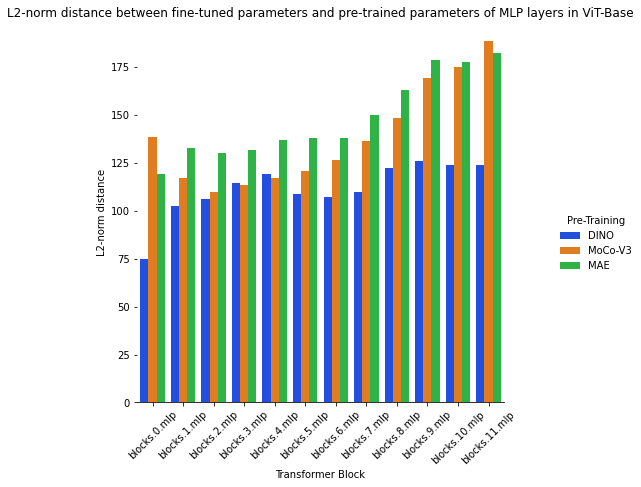

In [23]:
# Draw a nested barplot by species and sex
g = sns.catplot(
    data=df, kind="bar",
    x="layer", y="L2-norm distance", hue="pretraining",
    palette="bright", height=6
)
g.despine(left=True)
g.set_axis_labels("Transformer Block", "L2-norm distance")
g.legend.set_title("Pre-Training")

plt.xticks(rotation=45)
plt.title("L2-norm distance between fine-tuned parameters and pre-trained parameters of MLP layers in ViT-Base")
plt.savefig(fig_dir+'all_mlp_layers.png', dpi=300, bbox_inches='tight')

In [24]:
blocks = ['blocks.'+ str(i) +'.attn.qkv' for i in range(12)]
df = distances_df_new[distances_df_new['layer'].isin(blocks)]

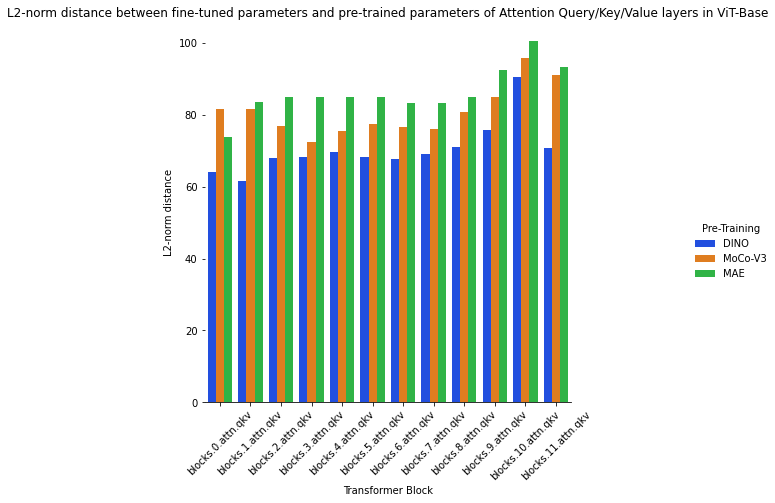

In [25]:
g = sns.catplot(
    data=df, kind="bar",
    x="layer", y="L2-norm distance", hue="pretraining",
    palette="bright", height=6
)
g.despine(left=True)
g.set_axis_labels("Transformer Block", "L2-norm distance")
g.legend.set_title("Pre-Training")

plt.xticks(rotation=45)
plt.title("L2-norm distance between fine-tuned parameters and pre-trained parameters of Attention Query/Key/Value layers in ViT-Base")
plt.savefig(fig_dir+'all_attn-qkv_layers.png', dpi=300, bbox_inches='tight')

In [26]:
blocks = ['blocks.'+ str(i) +'.mlp.fc1' for i in range(12)]
df = distances_df_new[distances_df_new['layer'].isin(blocks)]

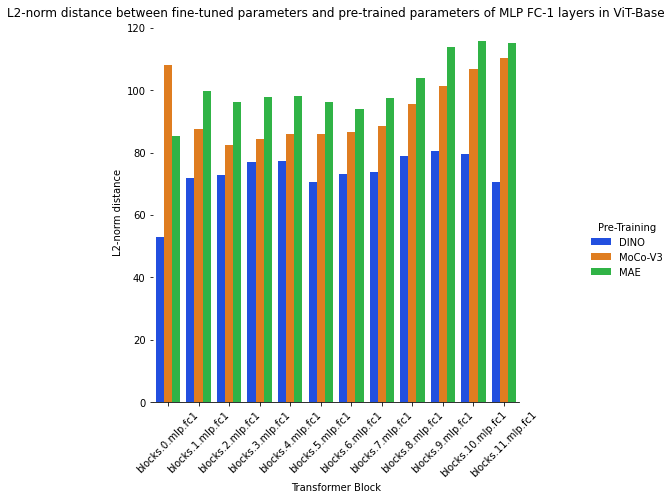

In [27]:
g = sns.catplot(
    data=df, kind="bar",
    x="layer", y="L2-norm distance", hue="pretraining",
    palette="bright", height=6
)
g.despine(left=True)
g.set_axis_labels("Transformer Block", "L2-norm distance")
g.legend.set_title("Pre-Training")

plt.xticks(rotation=45)
plt.title("L2-norm distance between fine-tuned parameters and pre-trained parameters of MLP FC-1 layers in ViT-Base")
plt.savefig(fig_dir+'all_mlp-fc1_layers.png', dpi=300, bbox_inches='tight')

In [28]:
blocks = ['blocks.'+ str(i) +'.norm2' for i in range(12)]
df = distances_df_new[distances_df_new['layer'].isin(blocks)]

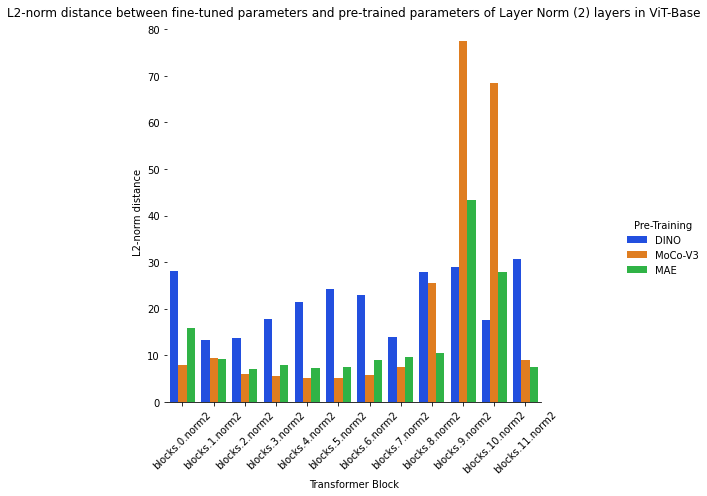

In [30]:
g = sns.catplot(
    data=df, kind="bar",
    x="layer", y="L2-norm distance", hue="pretraining",
    palette="bright", height=6
)
g.despine(left=True)
g.set_axis_labels("Transformer Block", "L2-norm distance")
g.legend.set_title("Pre-Training")

plt.xticks(rotation=45)
plt.title("L2-norm distance between fine-tuned parameters and pre-trained parameters of Layer Norm (2) layers in ViT-Base")
plt.savefig(fig_dir+'all_norm2_layers.png', dpi=300, bbox_inches='tight')

In [31]:
blocks = ['blocks.'+ str(i) +'.norm1' for i in range(12)]
df = distances_df_new[distances_df_new['layer'].isin(blocks)]

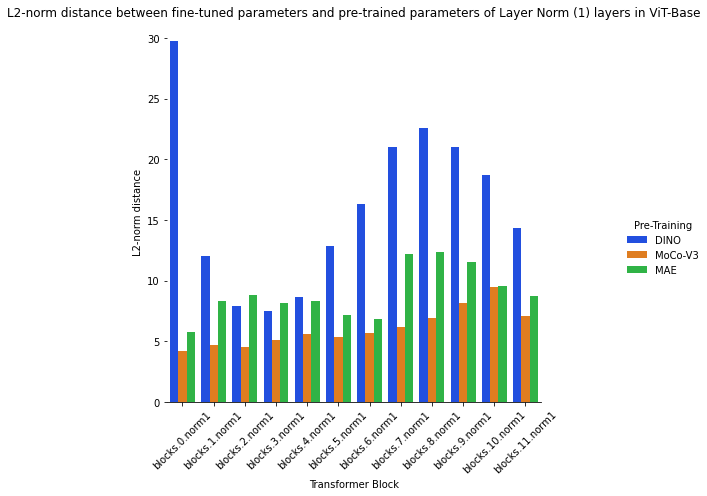

In [32]:
g = sns.catplot(
    data=df, kind="bar",
    x="layer", y="L2-norm distance", hue="pretraining",
    palette="bright", height=6
)
g.despine(left=True)
g.set_axis_labels("Transformer Block", "L2-norm distance")
g.legend.set_title("Pre-Training")

plt.xticks(rotation=45)
plt.title("L2-norm distance between fine-tuned parameters and pre-trained parameters of Layer Norm (1) layers in ViT-Base")
plt.savefig(fig_dir+'all_norm1_layers.png', dpi=300, bbox_inches='tight')

## Compare finetuning dynamics

In [30]:
from ast import literal_eval

In [31]:
results = {'MAE': [], 'MoCoV3': [], 'DINO': []}

for key in results:
    folder_name = "../checkpoints/" + key.lower() + "-norm/"
    log_file = folder_name + "ft_log.txt"

    log_list = []
    print(log_file)
    if os.path.isfile(log_file): 
        with open(log_file, "r") as log:
            for line in log:
                log_dict = literal_eval(line)
                log_list.append(log_dict)
               
    df = pd.DataFrame(log_list)
    df = df.set_index('epoch')
    results[key] = df

../checkpoints/mae-norm/ft_log.txt
../checkpoints/mocov3-norm/ft_log.txt
../checkpoints/dino-norm/ft_log.txt


In [32]:
for key in results:
    results[key]['change_lr'] = results[key]['train_norm_params_change'] / results[key]['train_lr']
    results[key]['change_lr_cumsum'] = results[key]['change_lr'].cumsum()
    results[key]['train_norm_params_change_cumsum'] = results[key]['train_norm_params_change'].cumsum()

    results[key].rename(columns={"change_lr": "L2-norm ΔParameters (LR scaled)", "train_norm_params_change": "L2-norm ΔParameters", "train_norm_params_after_update": 
                                "L2-norm Parameters", "change_lr_cumsum": "L2-norm ΔParameters (LR scaled, Cumulative Sum)", "train_norm_params_change_cumsum": 
                                "L2-norm ΔParameters (Cumulative Sum)"}, inplace=True)

    results[key]['L2-norm ΔParameters / L2-norm Parameters'] = results[key]['L2-norm ΔParameters'] / results[key]['L2-norm Parameters']
    results[key]['L2-norm ΔParameters / L2-norm Parameters (converged)'] = results[key]['L2-norm ΔParameters'] / results[key]['L2-norm Parameters'].iloc[-1]
    results[key]['L2-norm ΔParameters / L2-norm Parameters (initial)'] = results[key]['L2-norm ΔParameters'] / results[key]['L2-norm Parameters'].iloc[0]
    

In [33]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

In [34]:
def dynamics_plot(fig_dir, df1, df2, name1, name2, col):

    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)

    fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, figsize=(12, 9), dpi=300, sharex=True)

    sns.lineplot(x='epoch', y=col, data = df1, ax = ax1)
    sns.lineplot(x='epoch', y=col, data = df2, ax = ax1)

    axins1 = inset_axes(ax1,  "25%", "40%" ,loc="upper right", borderpad=2.5)
    sns.lineplot(x='epoch', y=col, data = df1, ax = axins1)
    sns.lineplot(x='epoch', y=col, data = df2, ax = axins1)
    axins1.set_xlim([0,8])
    axins1.set_xlabel("")
    axins1.set_ylabel("")

    sns.lineplot(x='epoch', y='test_acc1', data = df1, linestyle='--', ax = ax2)
    sns.lineplot(x='epoch', y='test_acc1', data = df2, linestyle='--', ax = ax2)

    axins2 = inset_axes(ax2, "25%", "40%" ,loc="upper right", borderpad=2.5)
    sns.lineplot(x='epoch', y='test_acc1', data = df1, linestyle='--', ax = axins2)
    sns.lineplot(x='epoch', y='test_acc1', data = df2, linestyle='--', ax = axins2)
    axins2.set_xlim([0,8])
    axins2.set_xlabel("")
    axins2.set_ylabel("")

    sns.lineplot(x='epoch', y='test_acc5', data = df1, linestyle='dashdot', ax = ax3)
    sns.lineplot(x='epoch', y='test_acc5', data = df2, linestyle='dashdot', ax = ax3)

    axins3 = inset_axes(ax3, "25%", "40%" ,loc="upper right", borderpad=2.5)
    sns.lineplot(x='epoch', y='test_acc5', data = df1, linestyle='--', ax = axins3)
    sns.lineplot(x='epoch', y='test_acc5', data = df2, linestyle='--', ax = axins3)
    axins3.set_xlim([0,8])
    axins3.set_xlabel("")
    axins3.set_ylabel("")

    ax3.set_xlabel("Fine-tuning Epochs")
    ax1.set_ylabel(col)
    ax2.set_ylabel('Test accuracy top-1')
    ax3.set_ylabel('Test accuracy top-5')

    ax2.legend(title='Pre-training algorithm', loc='lower center', labels=[name1, name2])
    plt.tight_layout()
    plt.show()

    fig.savefig(fig_dir+name1+'-'+name2+'.png')

    return fig


In [35]:
def dynamics_plot_single(fig_dir, df1, df2, df3, name1, name2, name3, col):

    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)

    fig, ax = plt.subplots(figsize=(12, 9), dpi=300, sharex=True)

    sns.lineplot(x='epoch', y=col, data = df1, ax = ax)
    sns.lineplot(x='epoch', y=col, data = df2, ax = ax)
    sns.lineplot(x='epoch', y=col, data = df3, ax = ax)

    '''
    axins = inset_axes(ax,  "25%", "40%" ,loc="upper right", borderpad=2.5)
    sns.lineplot(x='epoch', y=col, data = df1, ax = axins)
    sns.lineplot(x='epoch', y=col, data = df2, ax = axins)
    sns.lineplot(x='epoch', y=col, data = df3, ax = axins)
    axins.set_xlim([0,8])
    axins.set_xlabel("")
    axins.set_ylabel("")
    '''
    
    ax.set_xlabel("Fine-tuning Epochs")
    ax.set_ylabel(col)
    
    ax.legend(title='Pre-training algorithm', loc='lower center', labels=[name1, name2, name3])
    plt.tight_layout()
    plt.show()

    fig.savefig(fig_dir+name1+'-'+name2+'-'+name3+'.png')

    return fig

In [36]:
import itertools

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


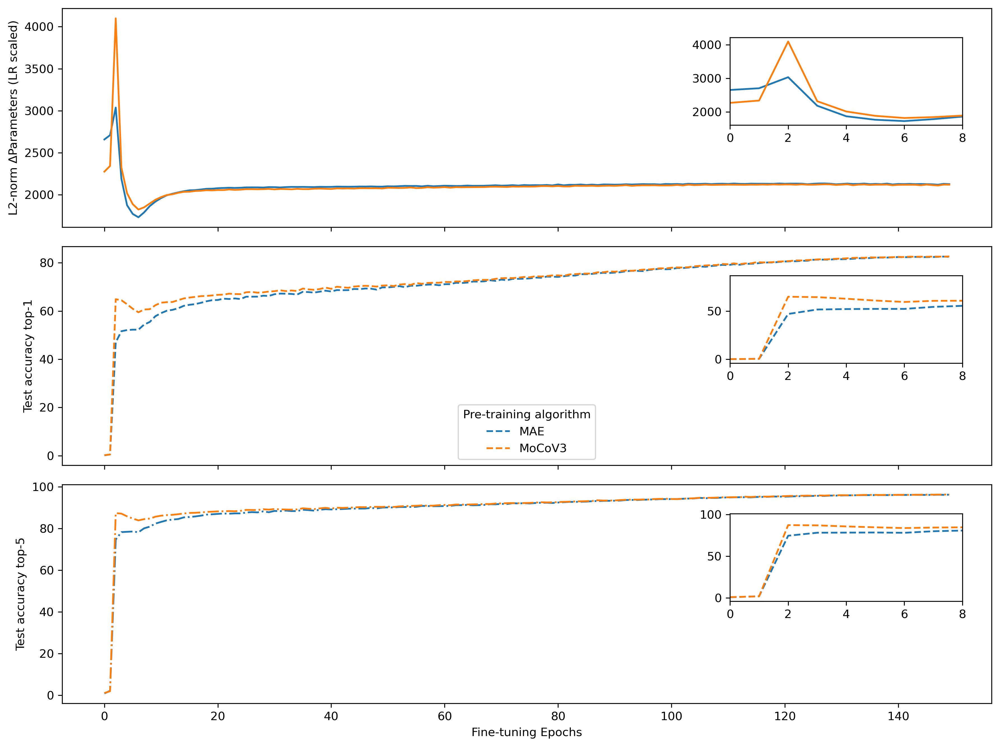

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


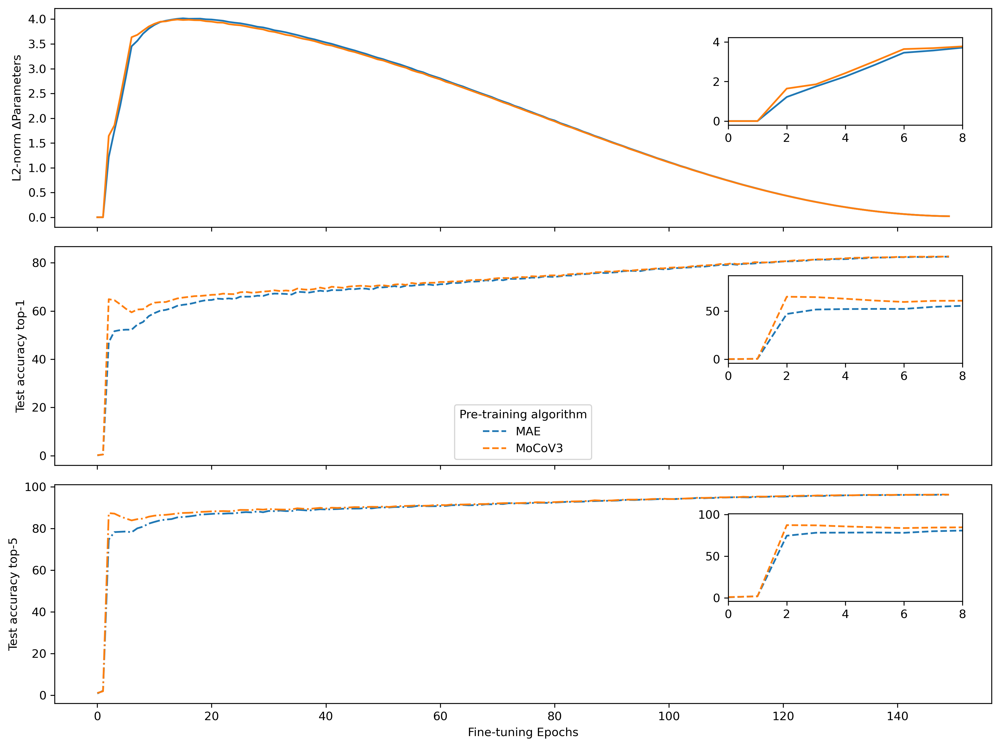

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


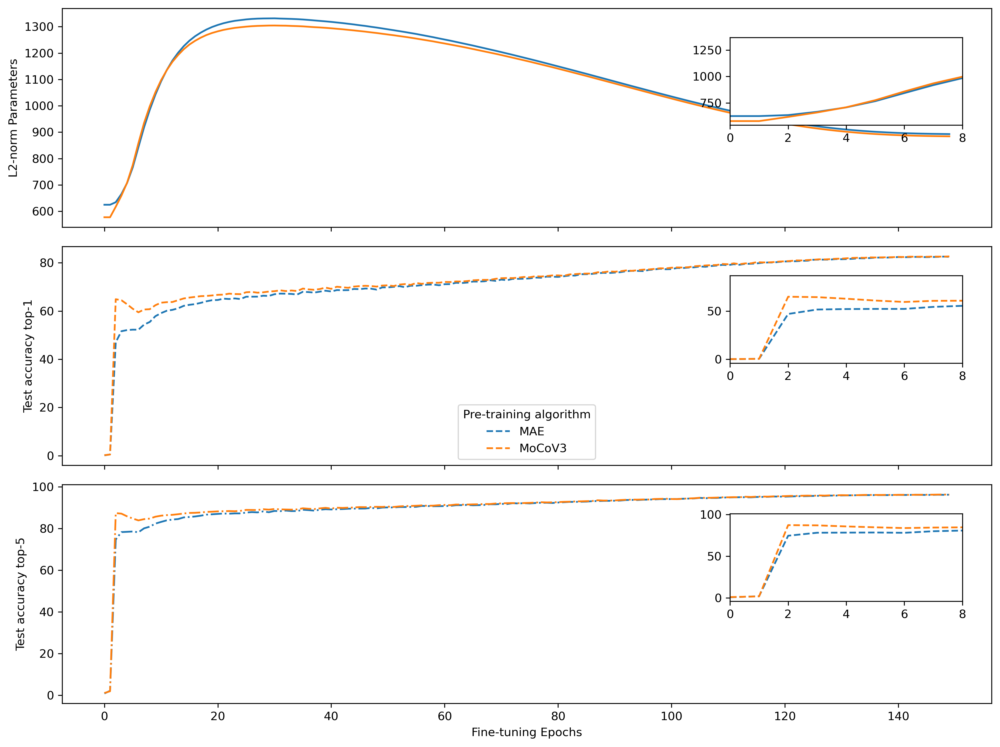

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


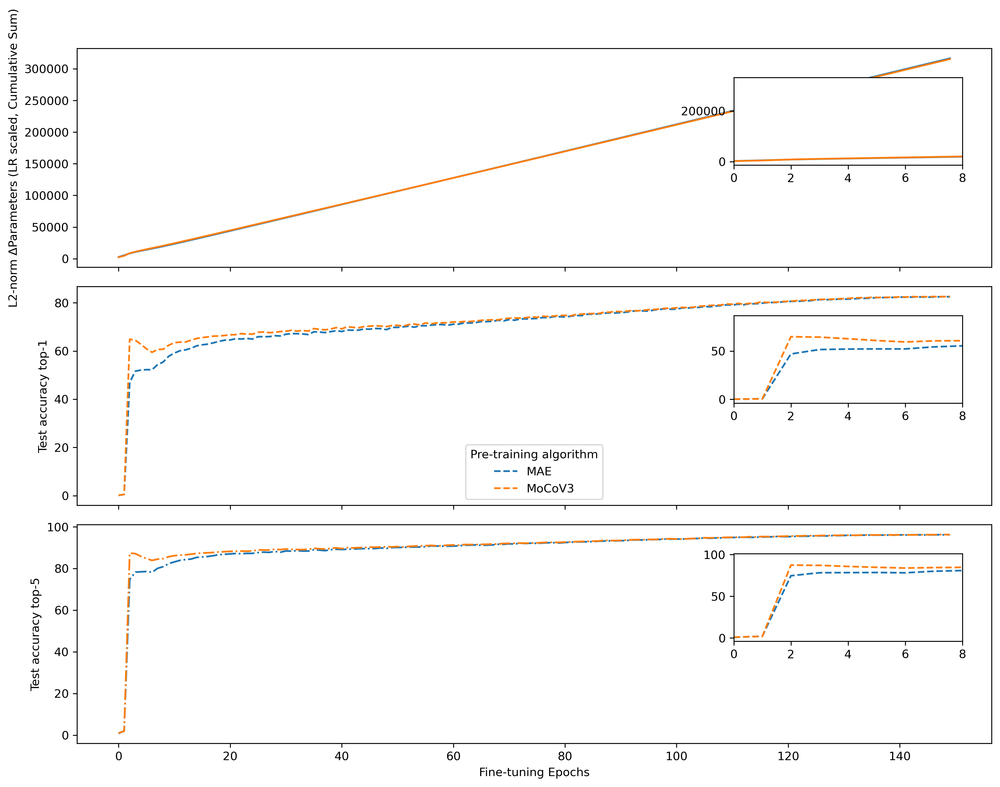

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


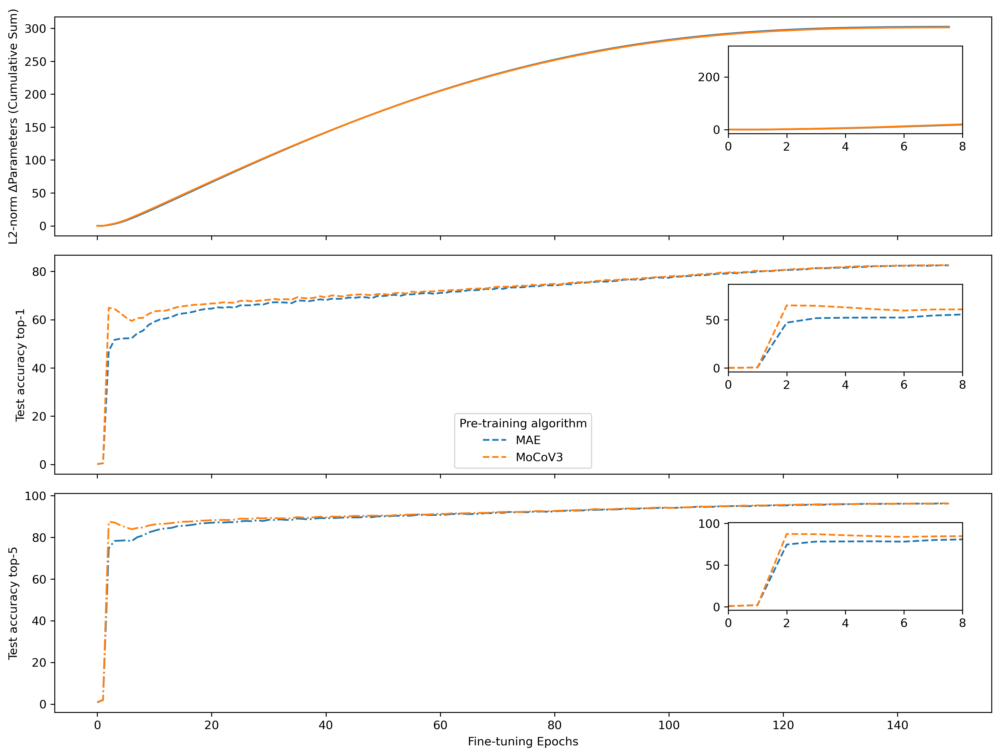

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


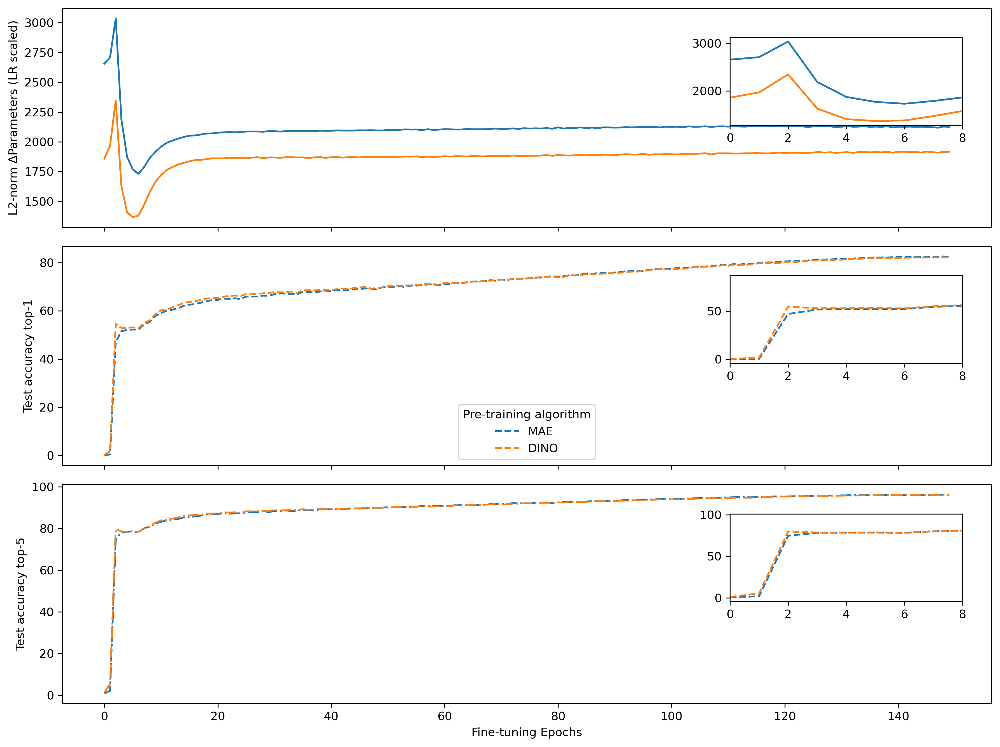

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


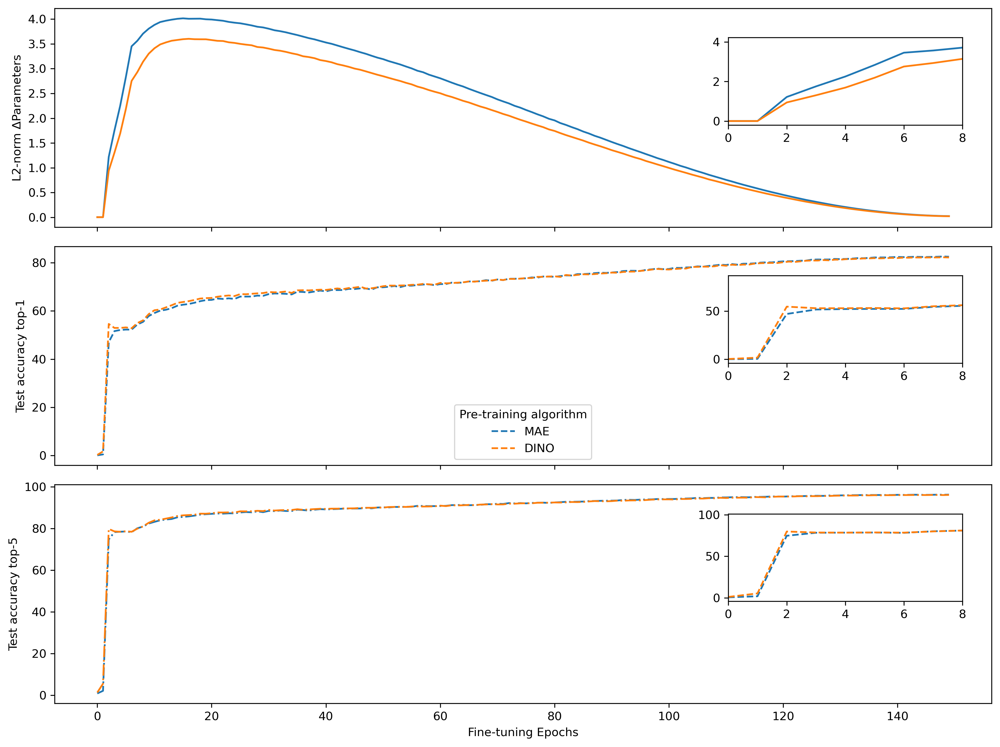

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


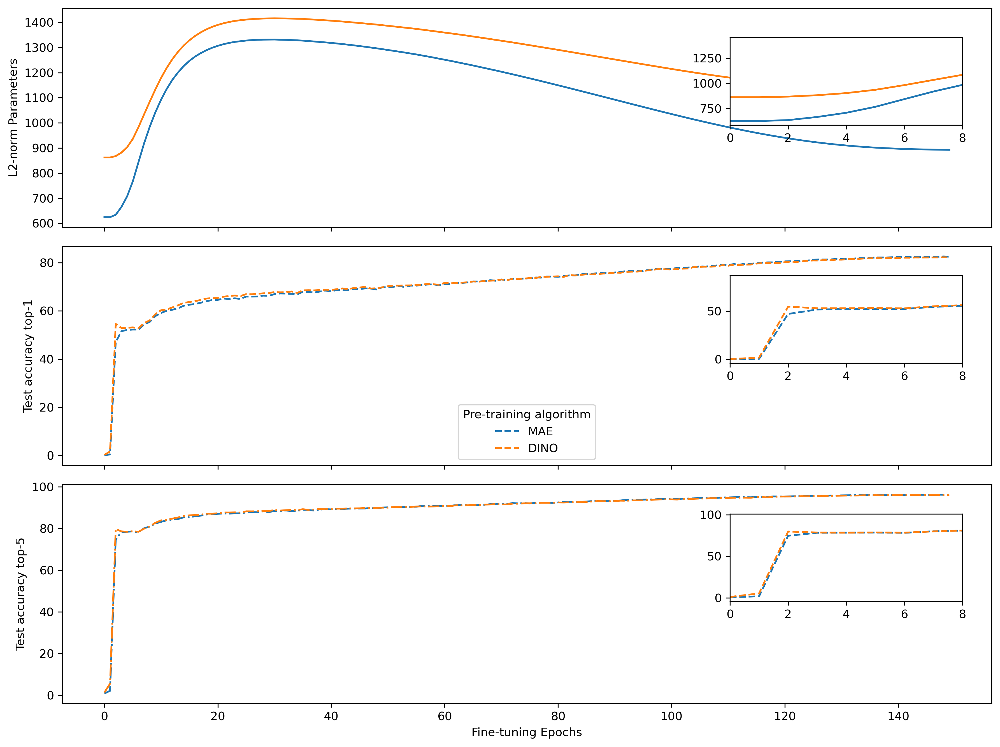

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


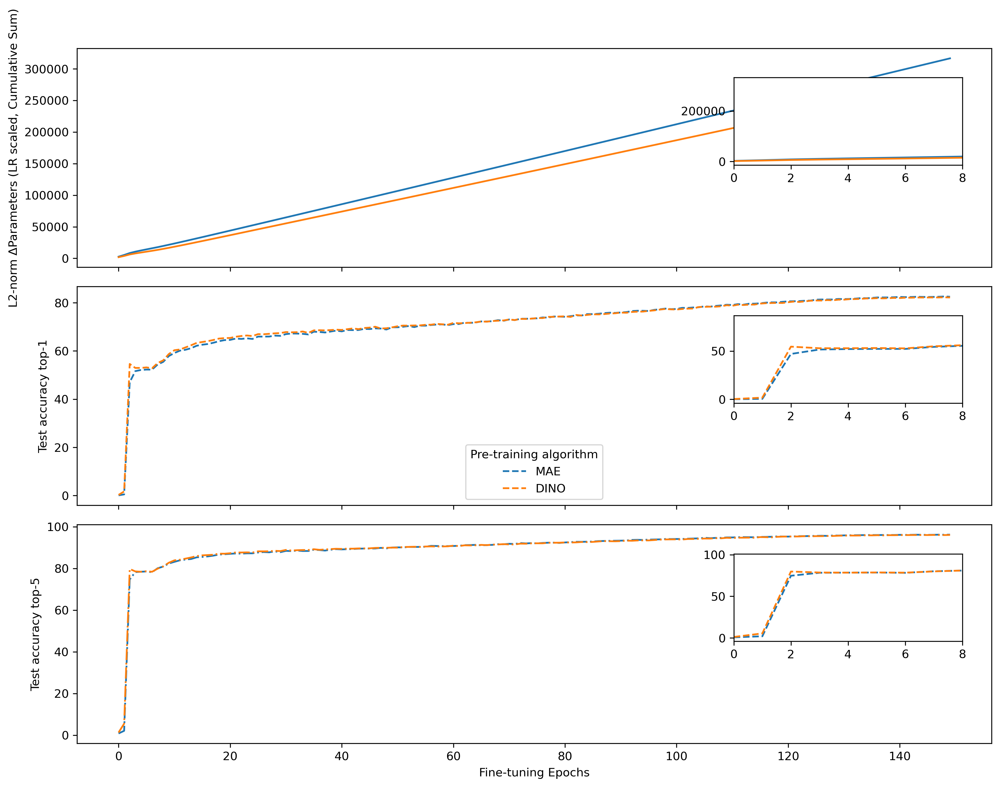

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


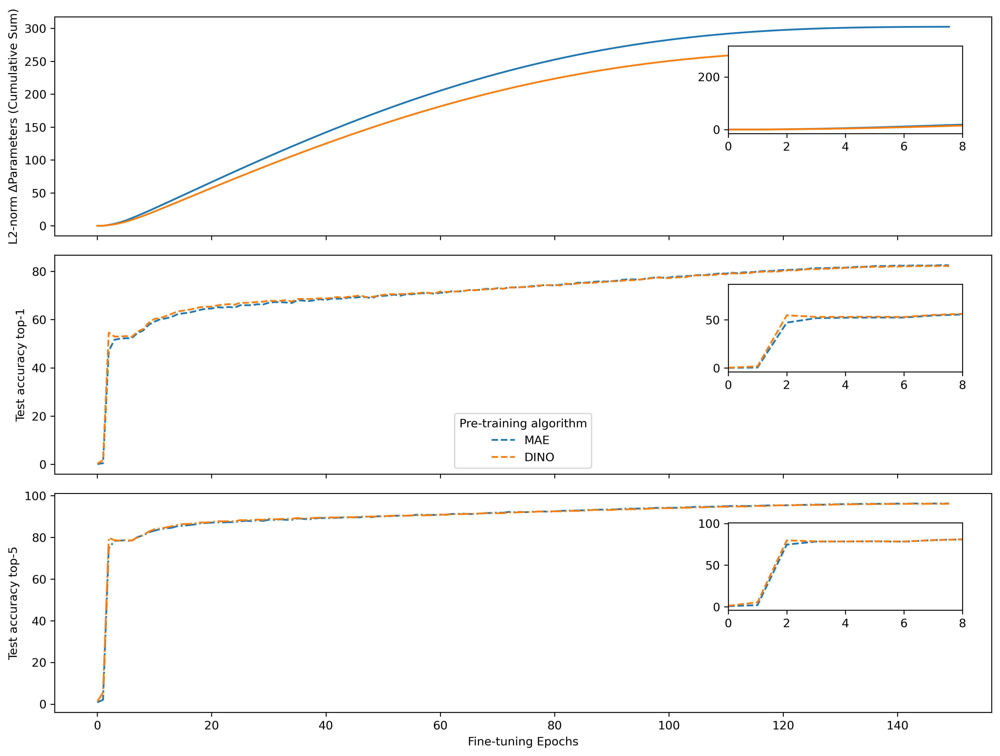

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


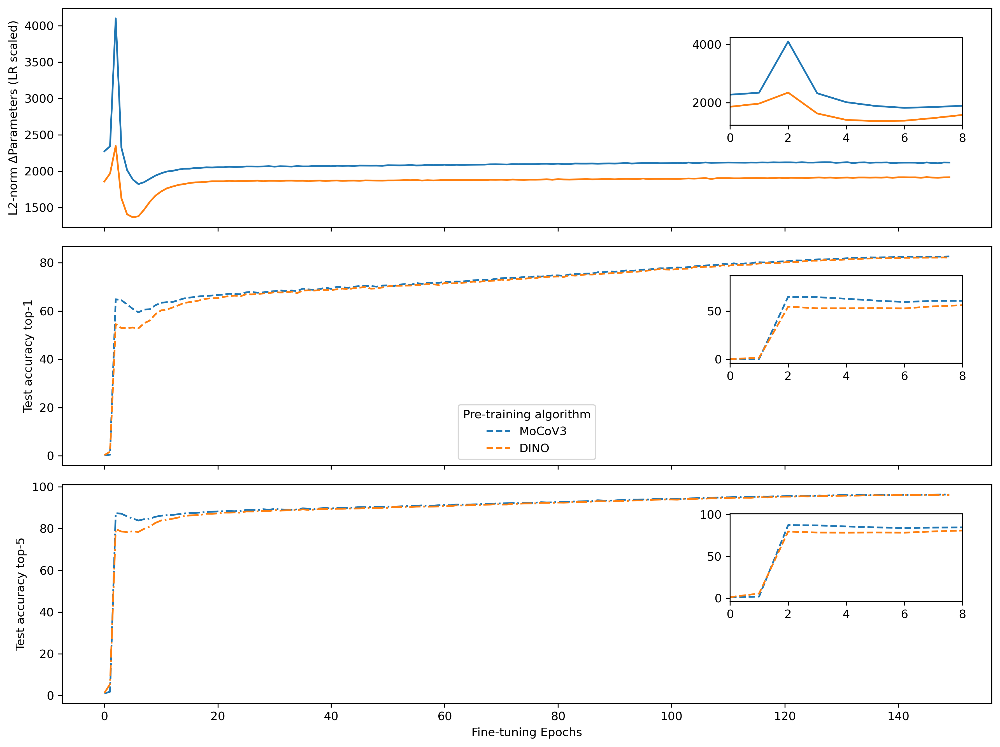

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


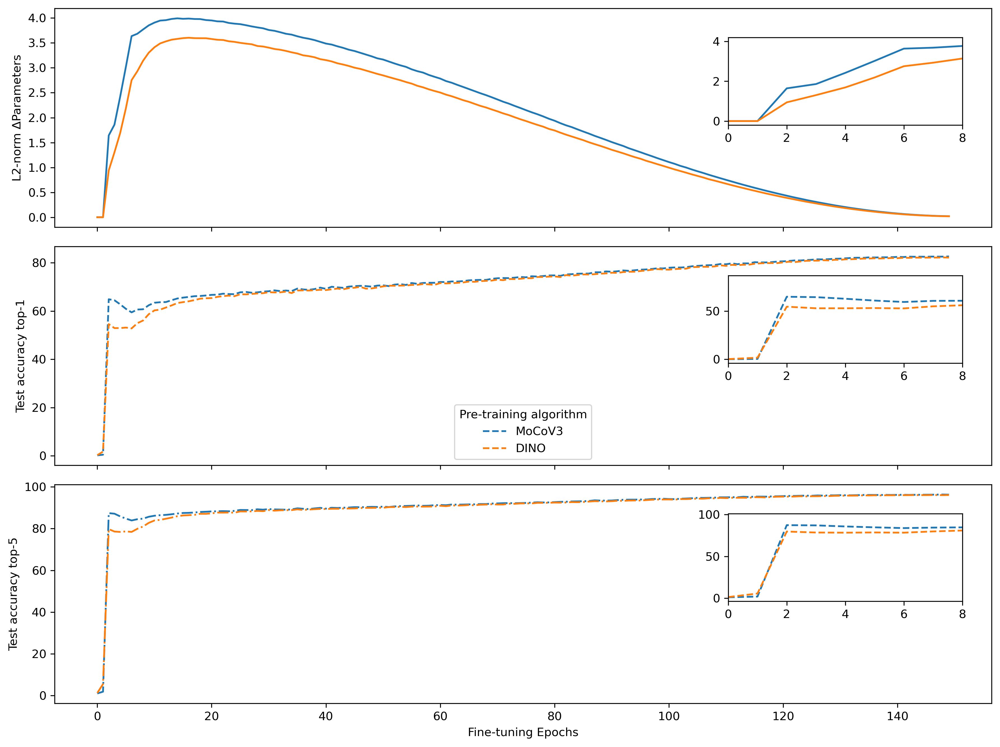

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


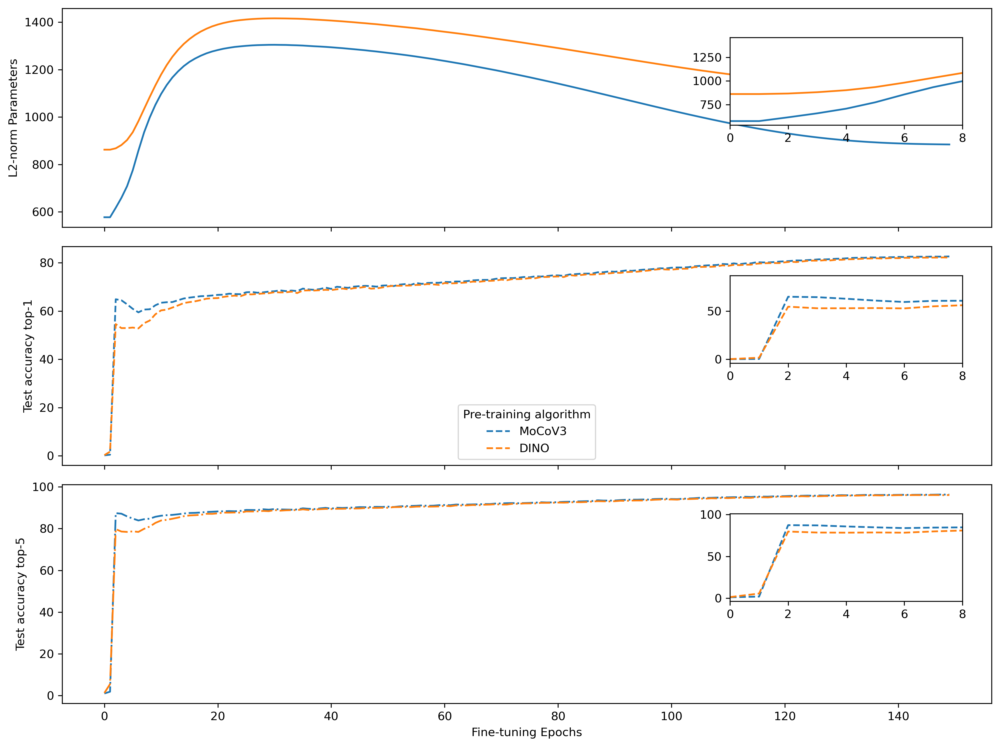

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


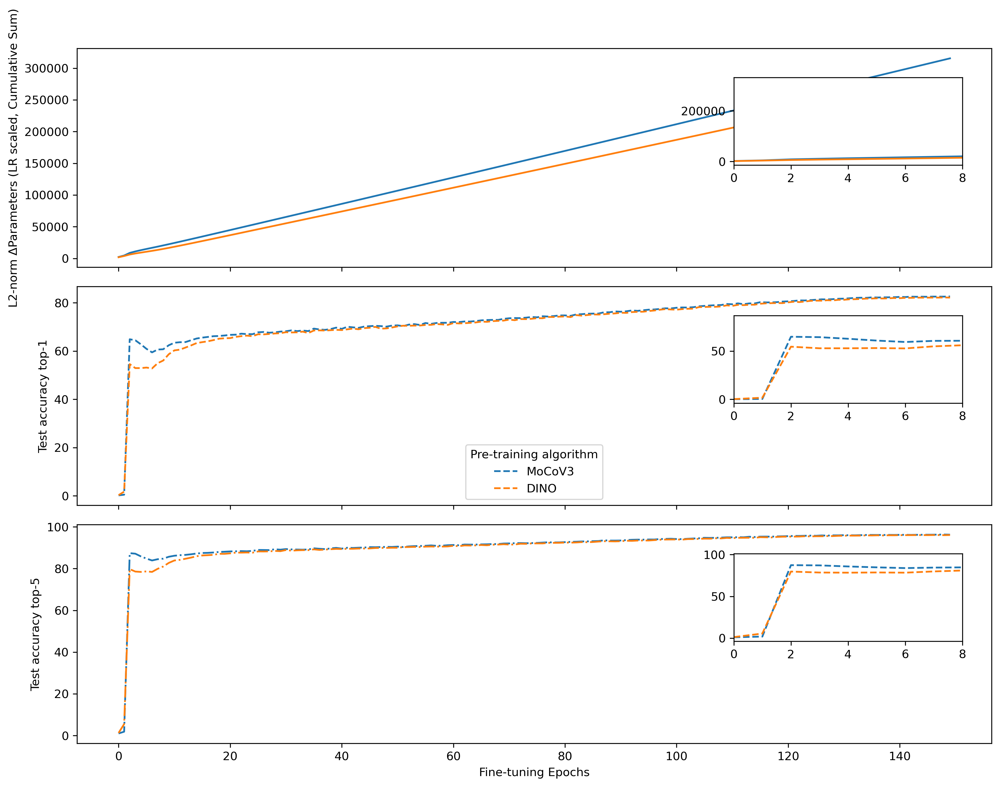

/tmp/ipykernel_945926/3508053162.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


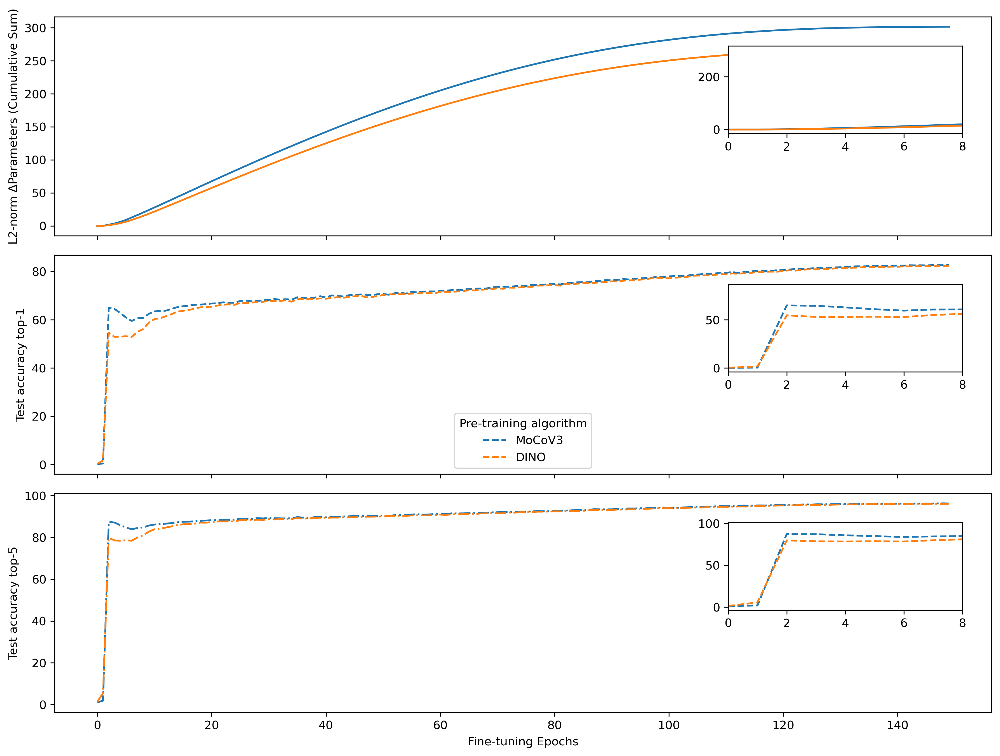

In [37]:
fig_dir = '../figures/dynamics/'

prod = itertools.combinations(results.keys(), 2)

for name1, name2 in prod:

    for col in ["L2-norm ΔParameters (LR scaled)", "L2-norm ΔParameters", "L2-norm Parameters", 
                "L2-norm ΔParameters (LR scaled, Cumulative Sum)", "L2-norm ΔParameters (Cumulative Sum)"]:
        full_fig_dir = fig_dir + col + '/'
        fig = dynamics_plot(full_fig_dir, results[name1], results[name2], name1, name2, col=col)

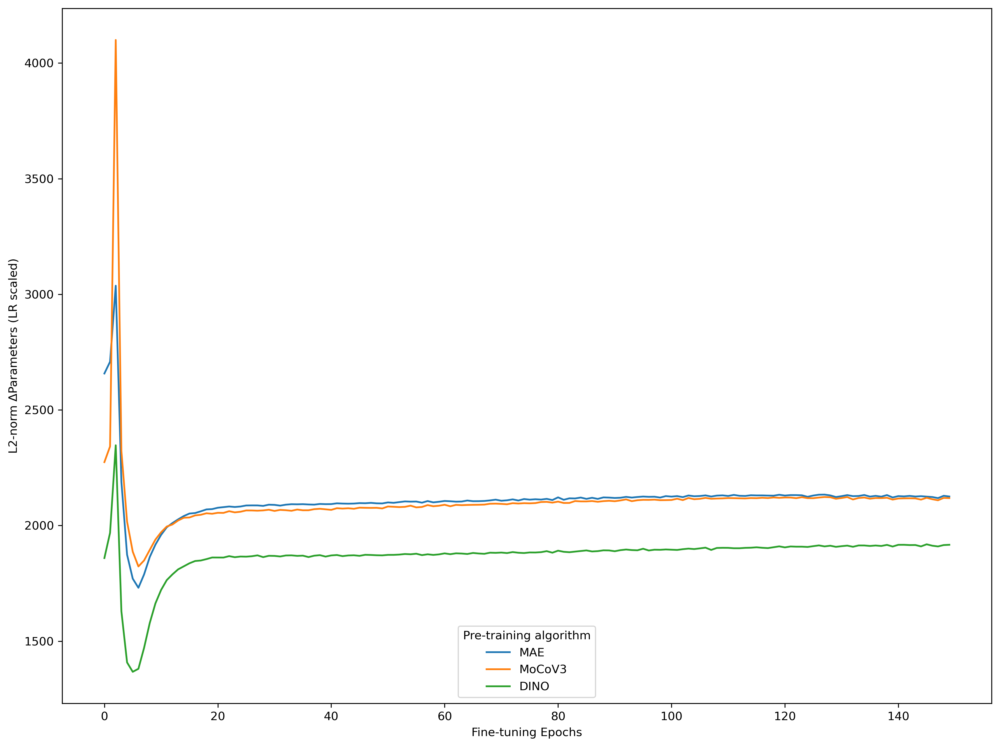

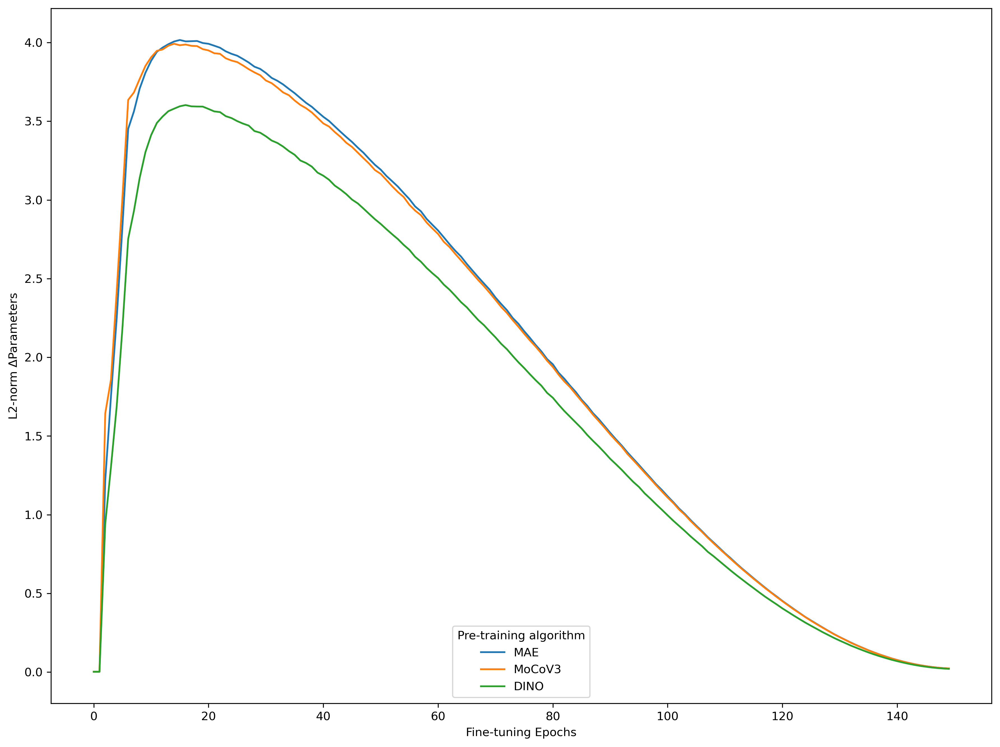

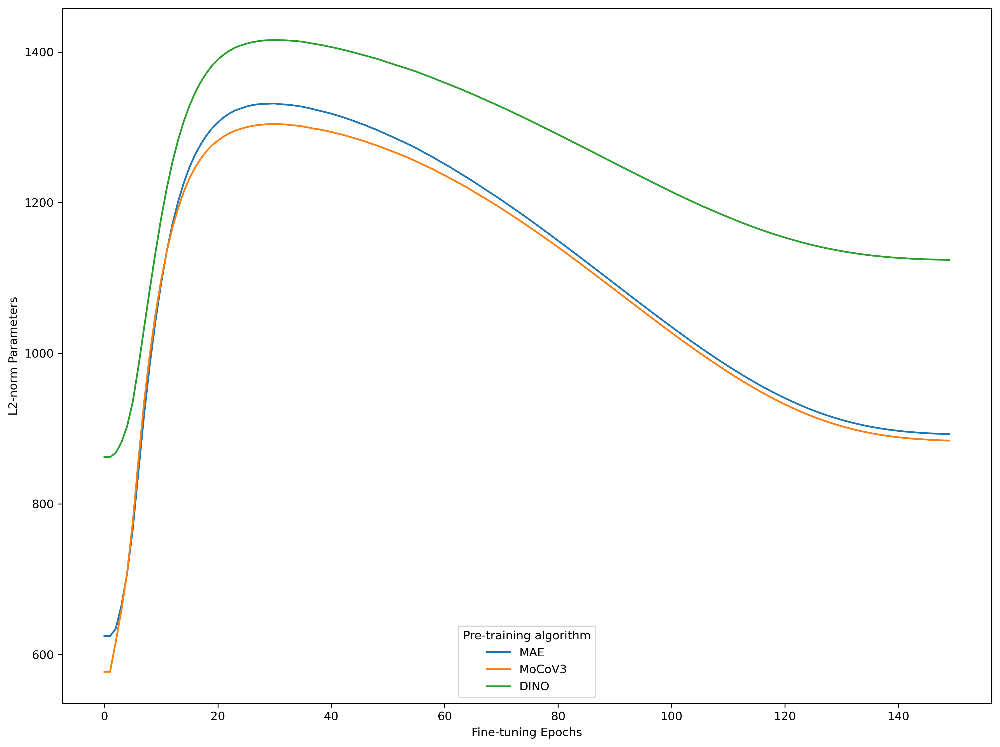

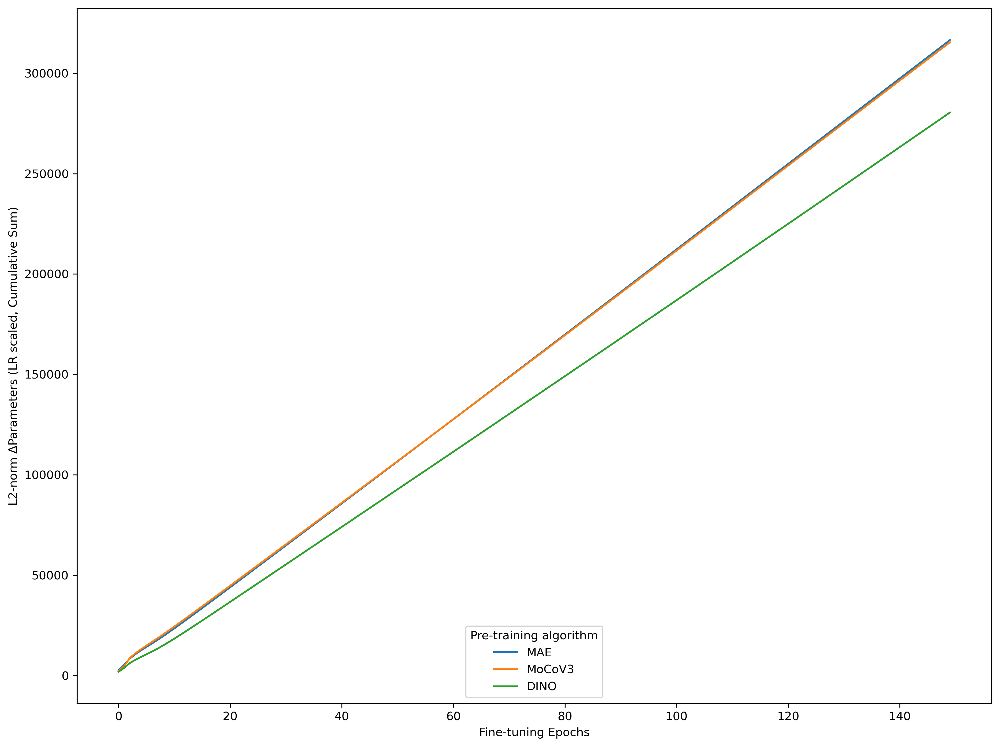

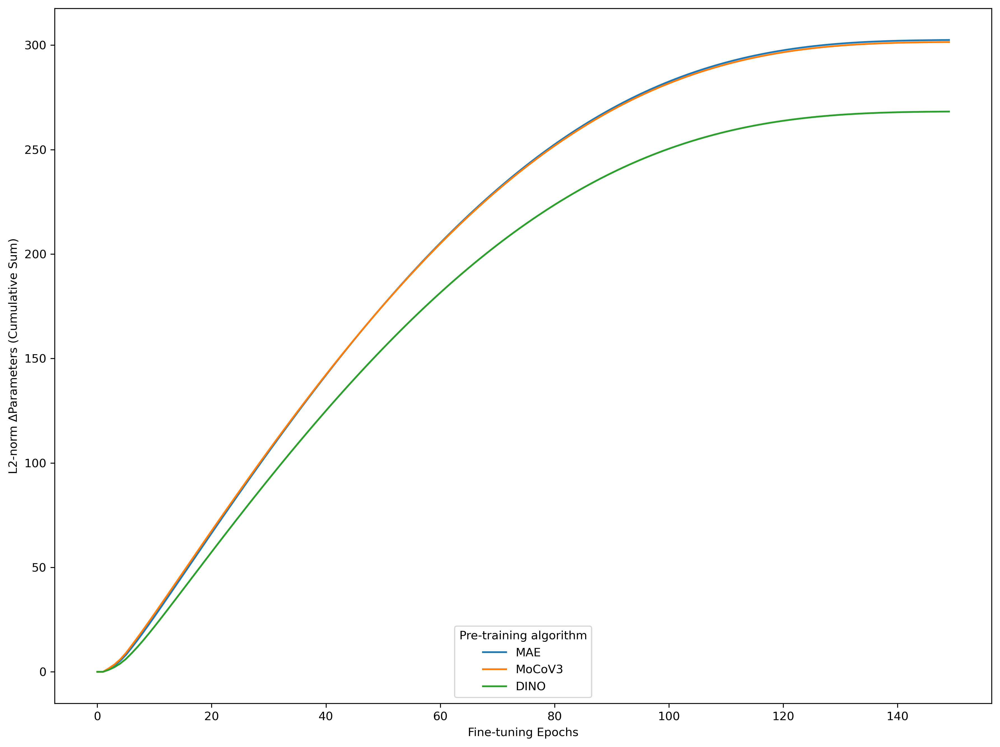

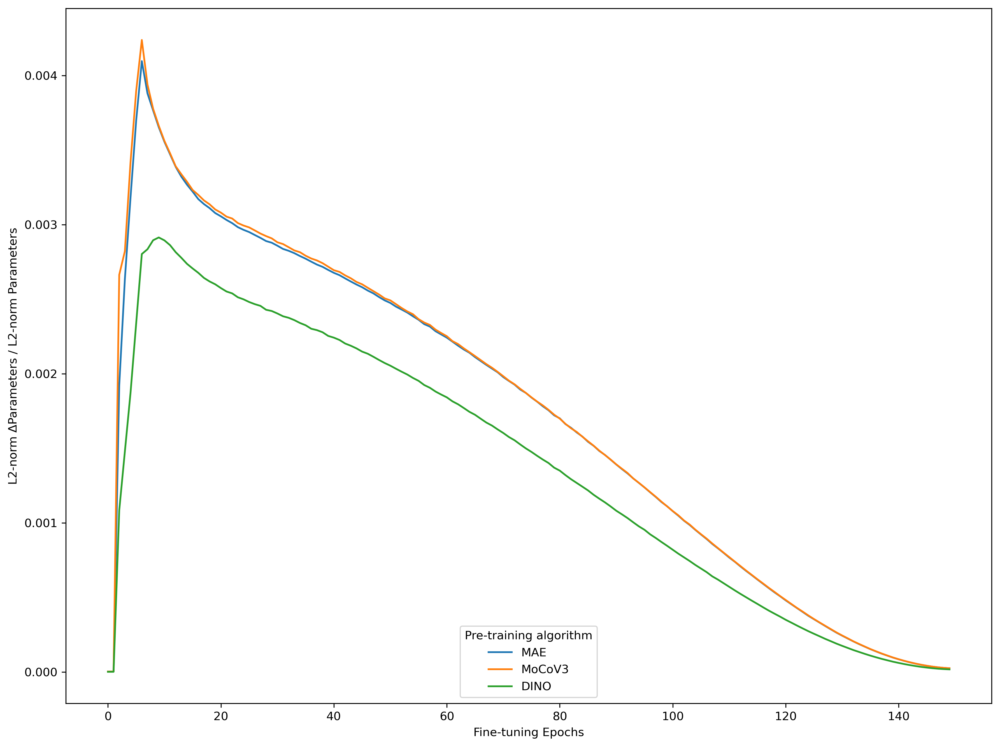

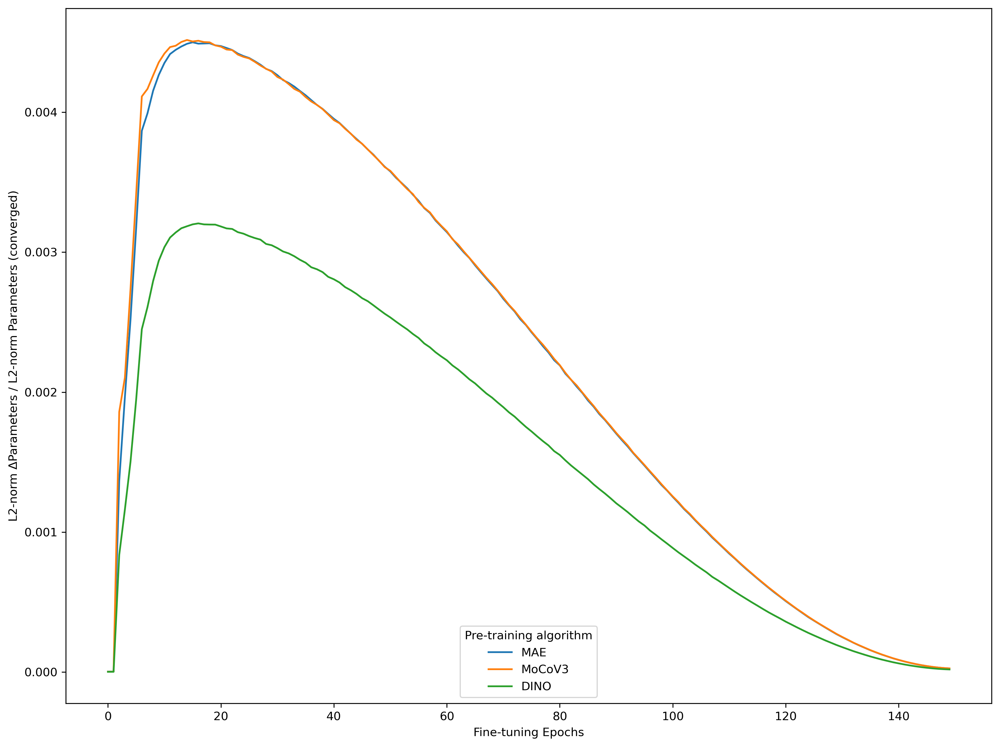

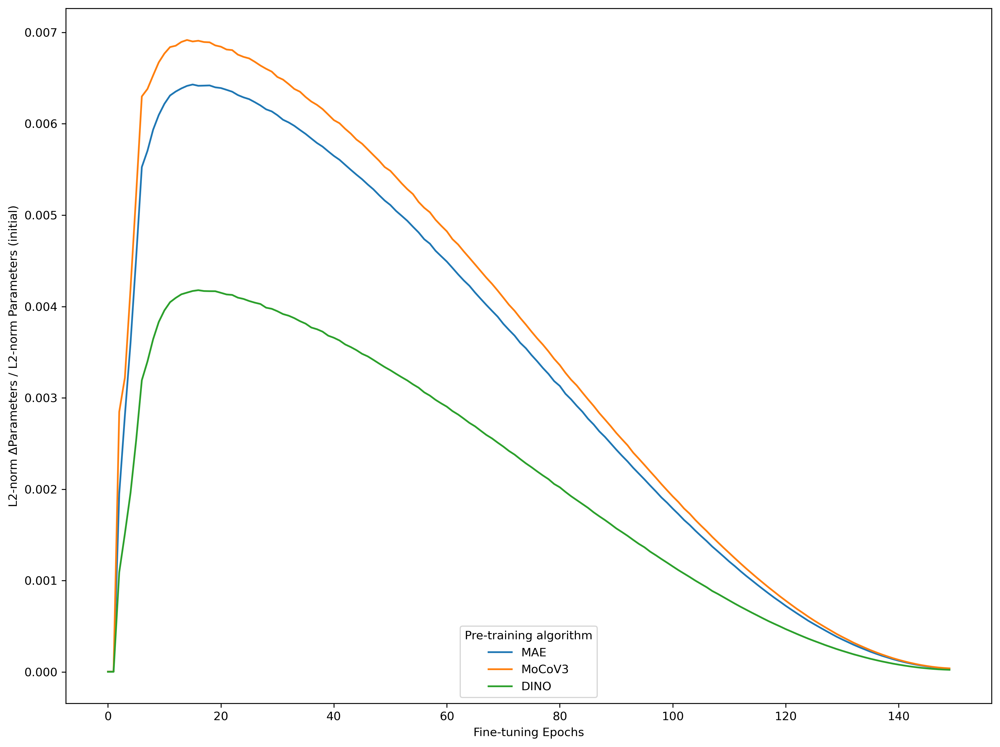

In [38]:
fig_dir = '../figures/dynamics/'

prod = itertools.combinations(results.keys(), 3)

for name1, name2, name3 in prod:

    for col in ["L2-norm ΔParameters (LR scaled)", "L2-norm ΔParameters", "L2-norm Parameters", 
                "L2-norm ΔParameters (LR scaled, Cumulative Sum)", "L2-norm ΔParameters (Cumulative Sum)",
                "L2-norm ΔParameters / L2-norm Parameters", "L2-norm ΔParameters / L2-norm Parameters (converged)",
                "L2-norm ΔParameters / L2-norm Parameters (initial)"]:
        full_fig_dir = fig_dir + col + '/'
        fig = dynamics_plot_single(full_fig_dir, results[name1], results[name2], results[name3], name1, name2, name3, col=col)

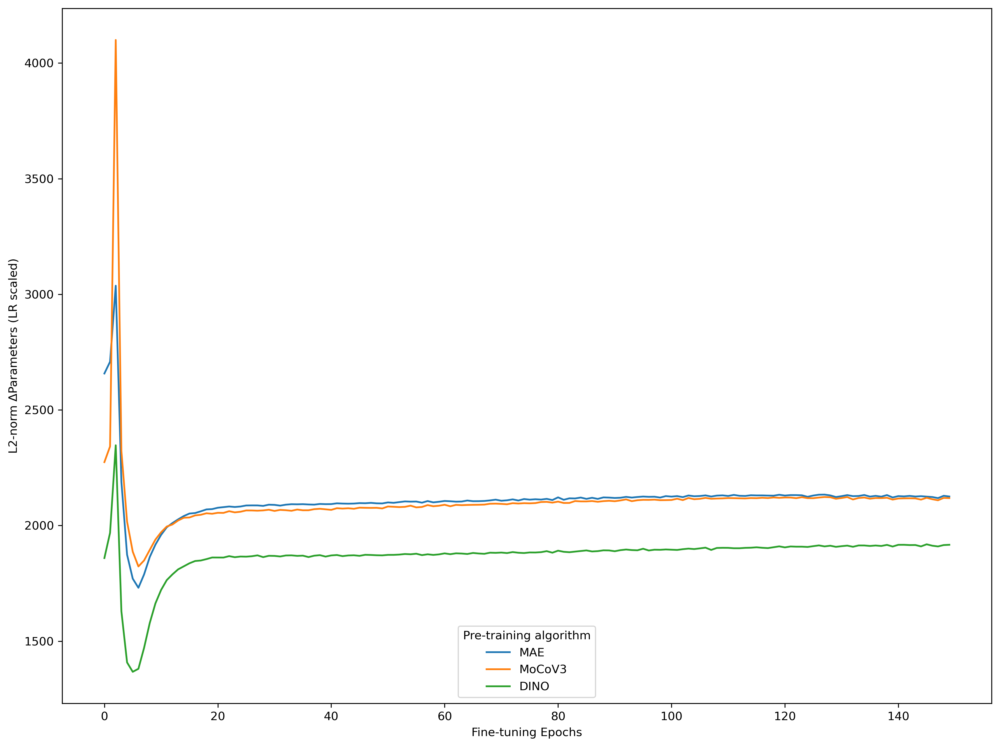

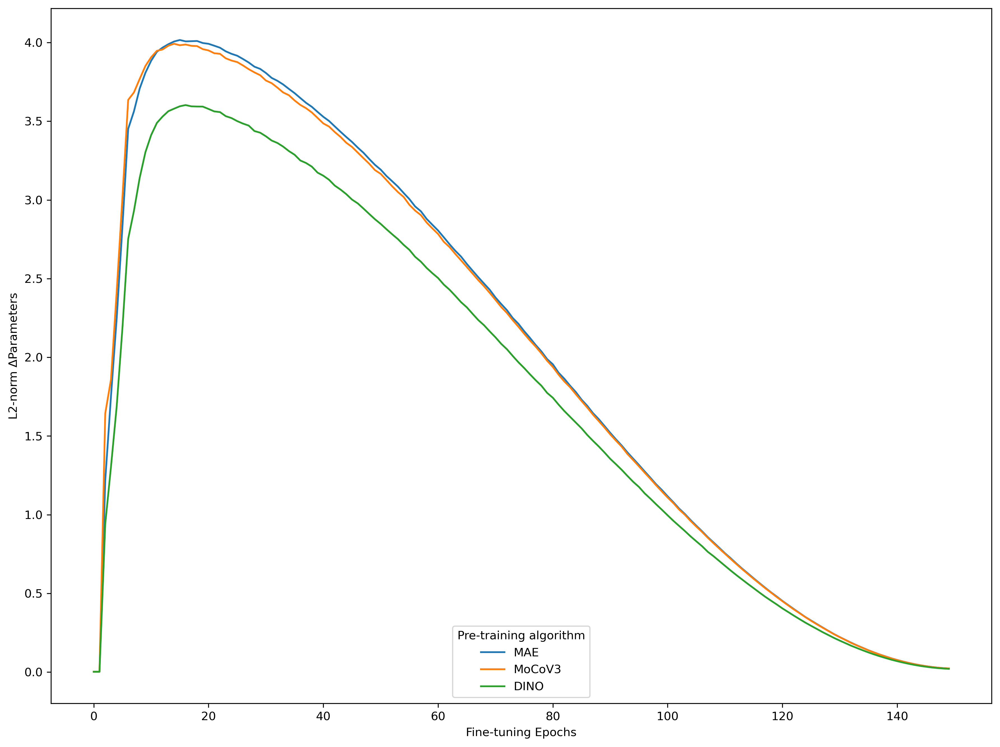

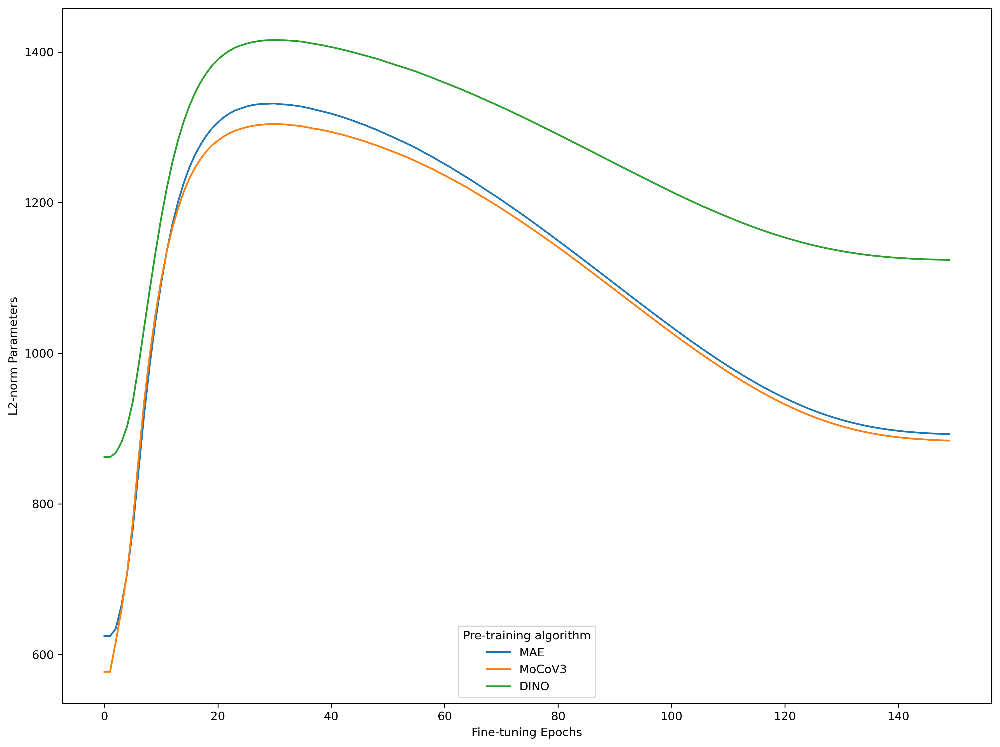

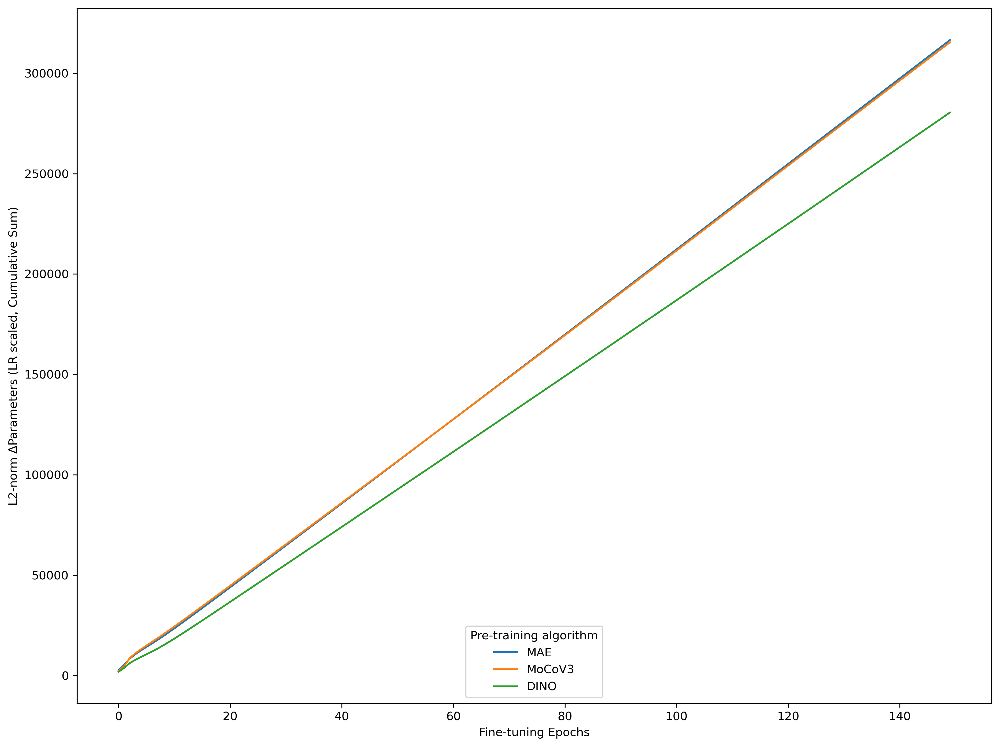

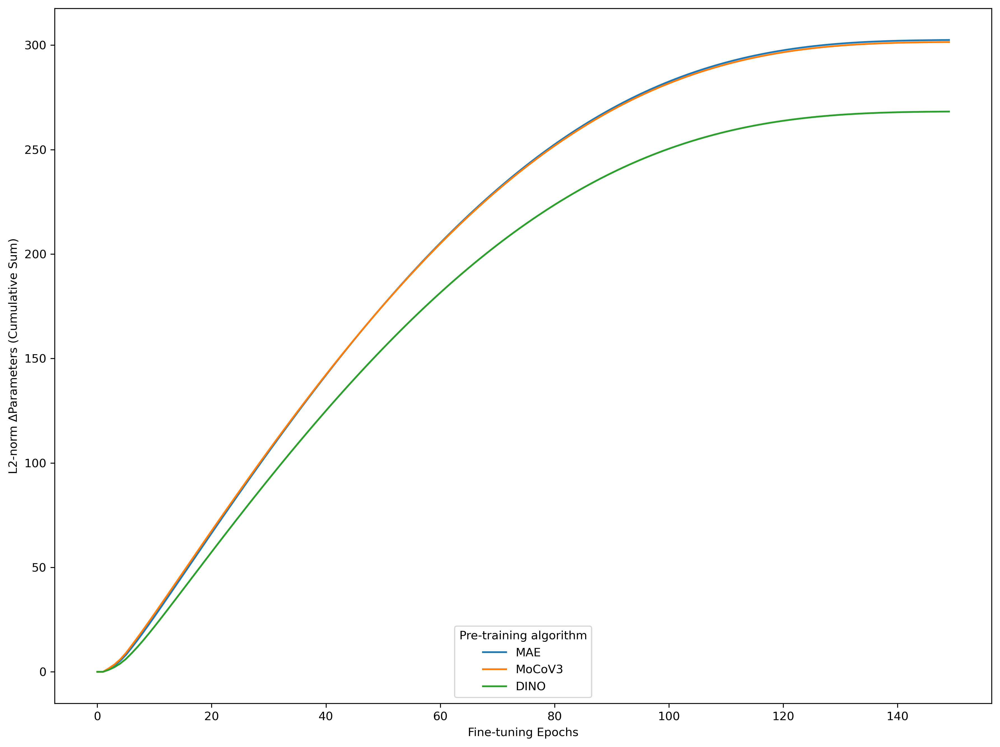

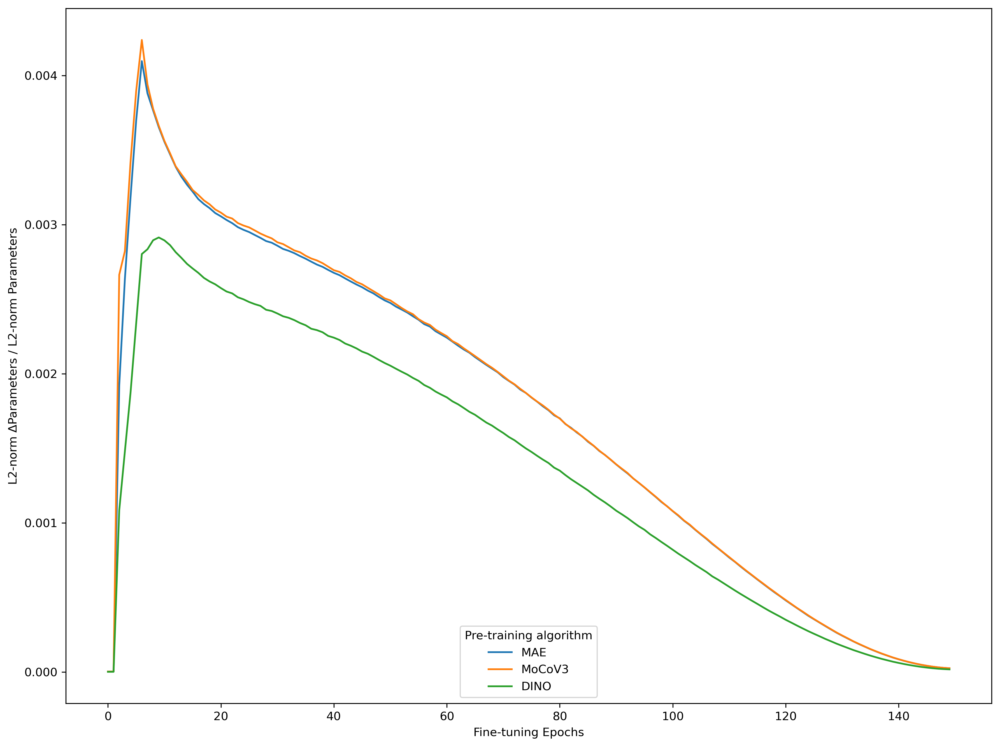

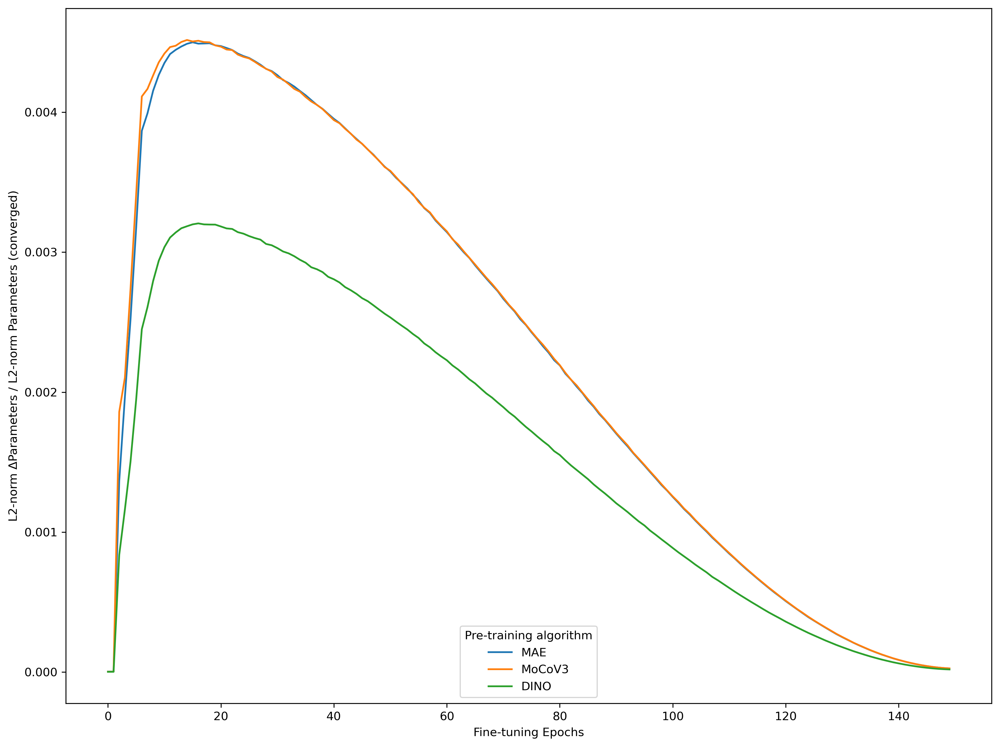

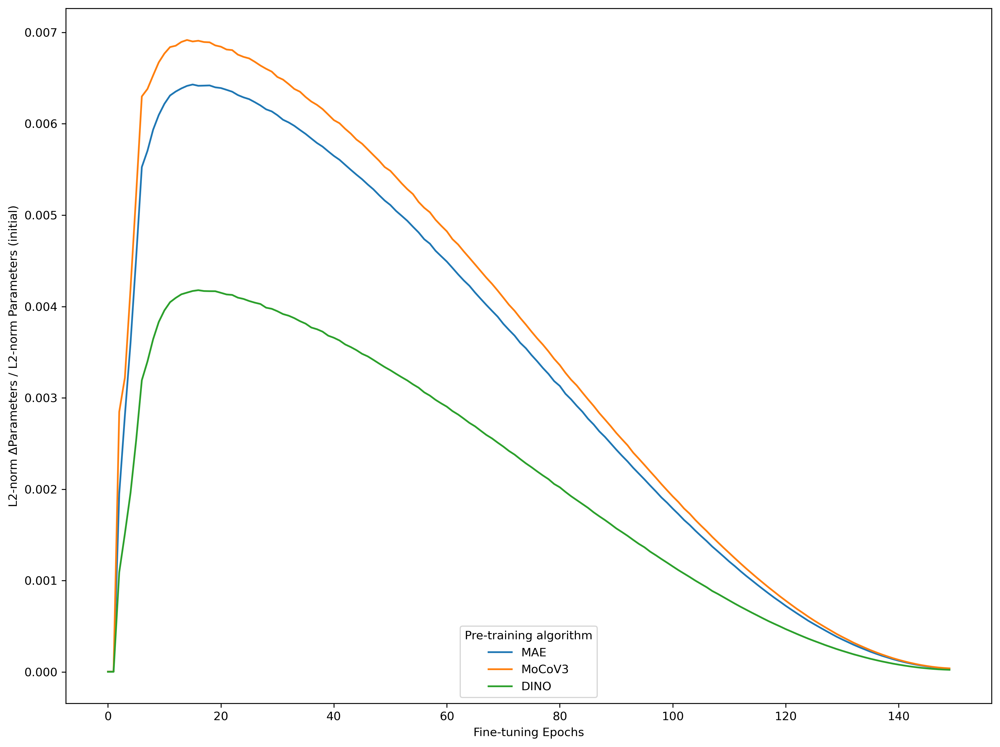

In [ ]:
fig_dir = '../figures/dynamics/'

prod = itertools.combinations(results.keys(), 3)

for name1, name2, name3 in prod:

    for col in ["L2-norm ΔParameters (LR scaled)", "L2-norm ΔParameters", "L2-norm Parameters", 
                "L2-norm ΔParameters (LR scaled, Cumulative Sum)", "L2-norm ΔParameters (Cumulative Sum)",
                "L2-norm ΔParameters / L2-norm Parameters", "L2-norm ΔParameters / L2-norm Parameters (converged)",
                "L2-norm ΔParameters / L2-norm Parameters (initial)"]:
        full_fig_dir = fig_dir + col + '/'
        fig = dynamics_plot_single(full_fig_dir, results[name1], results[name2], results[name3], name1, name2, name3, col=col)